###### Question 1.1 : Instructions
Open the only DICOM image available in the dataset with pydicom, and give me the important informations of it (use pydicom documentation).

In [1]:
import sys
import numpy as np
import pydicom

filename = "t1.dcm"
ds = pydicom.dcmread(filename)
print(ds)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 196
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.12.2.1107.5.8.15.132345.30000023042618235178900000473
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.12.2.1107.5.99.3.20080101
(0002, 0013) Implementation Version Name         SH: 'SIEMENS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'M', 'ND', 'NORM', 'FM2_2', 'FIL']
(0008, 0012) Instance Creation Date              DA: '20161027'
(0008, 0013) Instance Creation Time              TM: '183522.046000'
(0008, 0016) SOP Class UID                       UI: MR Image

###### Question 1.2 : Instructions
Change the name, surname of the file and save it with the new name. Re-open it and ensure that the modifications were taken into account

In [2]:
import pydicom

filename = "t1.dcm"
ds = pydicom.dcmread(filename)

new_name = "Grace Sevillano"
ds.PatientName = new_name

new_filename = "t1_modified.dcm"
ds.save_as(new_filename)

ds_modified = pydicom.dcmread(new_filename)
print("Modified Patient's Name:", ds_modified.PatientName)

if ds_modified.PatientName == new_name:
    print("Modifications were saved successfully.")
else:
    print("Modifications were not saved.")

print(ds_modified)

Modified Patient's Name: Grace Sevillano
Modifications were saved successfully.
Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 196
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.12.2.1107.5.8.15.132345.30000023042618235178900000473
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.12.2.1107.5.99.3.20080101
(0002, 0013) Implementation Version Name         SH: 'SIEMENS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'M', 'ND', 'NORM', 'FM2_2', 'FIL']
(0008, 0012) Instance Creation Date              DA: '20161027'
(0008, 0013) Instance Creation Time              T

###### Question 1.3 : Instructions
Add a white square within the image and save it in a new DICOM. Open this new image and ensure the white square presence in the center of the image.

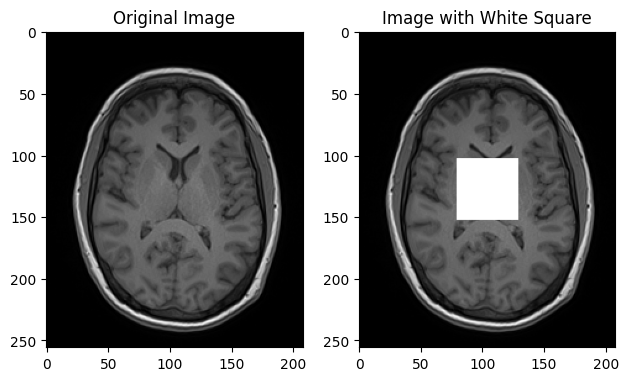

In [3]:
import numpy as np
import matplotlib.pyplot as plt

filename = "t1.dcm"
ds = pydicom.dcmread(filename)

image_array = ds.pixel_array

plt.subplot(1, 2, 1)
plt.imshow(image_array, cmap=plt.cm.gray)
plt.title('Original Image')

square_size = 50
rows, cols = image_array.shape
start_row = rows // 2 - square_size // 2
start_col = cols // 2 - square_size // 2
image_array[start_row:start_row+square_size, start_col:start_col+square_size] = np.max(image_array)

ds.PixelData = image_array.tobytes()

new_filename = "t1_square.dcm"
ds.save_as(new_filename)

ds_modified = pydicom.dcmread(new_filename)
modified_image_array = ds_modified.pixel_array

plt.subplot(1, 2, 2)
plt.imshow(modified_image_array, cmap=plt.cm.gray)
plt.title('Image with White Square')

plt.tight_layout()
plt.show()

###### Question 2.1 : Instructions
The first task is to open the DICOM image( t1.dcm ) and display it using the matplotlib library. Display also the k-Space. You can create a function, it will be used often.

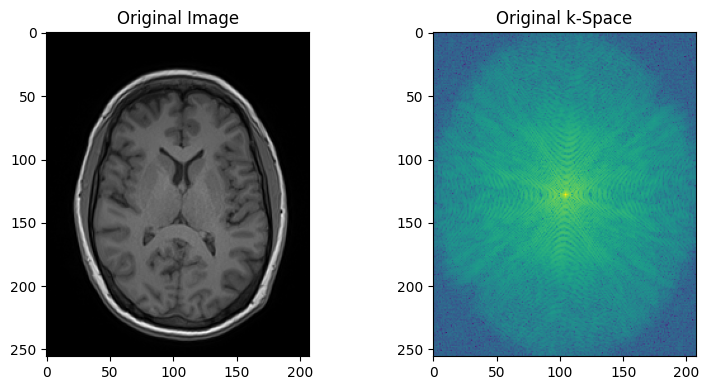

In [4]:
filename = "t1.dcm"
ds = pydicom.dcmread(filename)

image_array = ds.pixel_array

k_space = np.fft.fftshift(np.fft.fft2(image_array))

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image_array, cmap=plt.cm.gray)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(k_space)))
plt.title('Original k-Space')

plt.tight_layout()
plt.show()

###### Question 2.2 : Instructions
Then rotate 90 degrees the image and observe the impact in the k-Space. What is the impact of the rotation ?

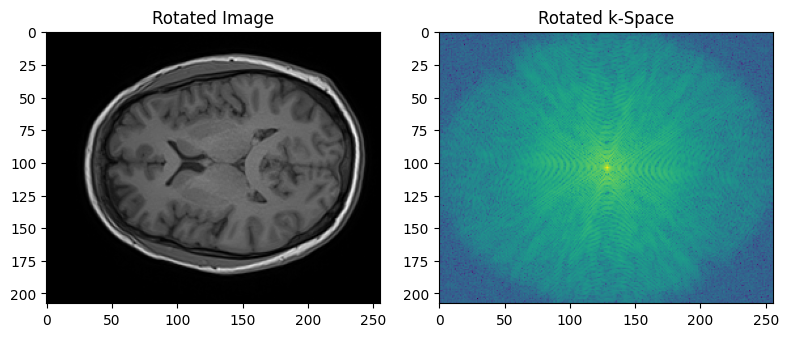

In [5]:
from scipy.ndimage import rotate

rotated_image = rotate(image_array, 90)

rotated_k_space = np.fft.fftshift(np.fft.fft2(rotated_image))

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(rotated_image, cmap=plt.cm.gray)
plt.title('Rotated Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(rotated_k_space)))
plt.title('Rotated k-Space')

plt.tight_layout()
plt.show()

###### Question 2.3 : Instructions
Transform file test.npy into the image space.

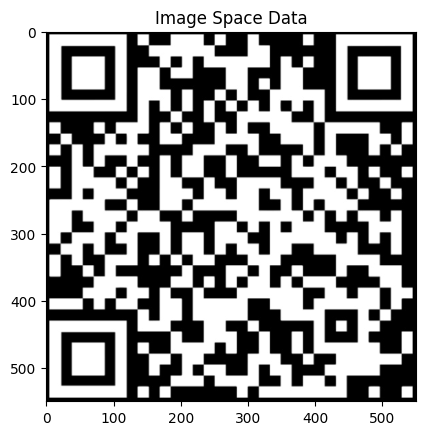

In [6]:
k_space_data = np.load("test.npy")

image_space_data = np.fft.ifft2(np.fft.ifftshift(k_space_data))

plt.figure()
plt.imshow(np.real(image_space_data), cmap=plt.cm.gray)
plt.title("Image Space Data")
plt.show()

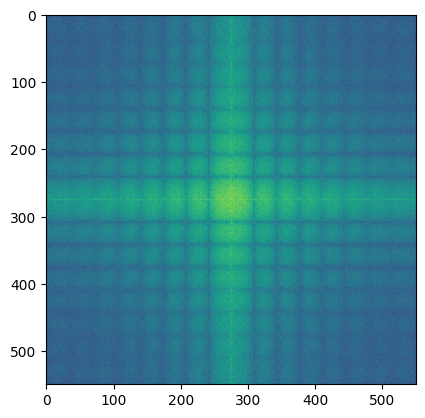

In [7]:
plt.imshow(np.log(np.abs(k_space_data)))
plt.show()

###### Question 2.4 : Instructions
The next step will be to modify the k-space and analyze how the proposed treatment will impact the final image. You will have to go back from k-space to image space. We propose two k-space treatments: removing the center and removing the outside.

Describe the impact of each treatment in the k-Space on the final image.

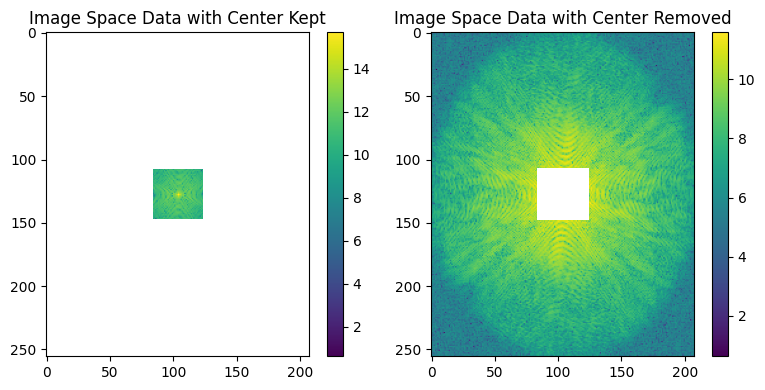

In [8]:
k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_center_kept = k_space_imag.copy()
center_x, center_y = k_space_imag.shape[0] // 2, k_space_imag.shape[1] // 2
center_size = 20  
k_space_center_kept[:center_x - center_size, :] = np.nan
k_space_center_kept[center_x + center_size:, :] = np.nan
k_space_center_kept[:, :center_y - center_size] = np.nan
k_space_center_kept[:, center_y + center_size:] = np.nan

k_space_center_removed = k_space_imag.copy()
k_space_center_removed[center_x - center_size:center_x + center_size, center_y - center_size:center_y + center_size] = np.nan

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(k_space_center_kept, vmin=np.min(k_space_imag), vmax=np.max(k_space_imag))
plt.colorbar()
plt.title("Image Space Data with Center Kept")

plt.subplot(1, 2, 2)
plt.imshow(k_space_center_removed)
plt.title("Image Space Data with Center Removed")

plt.tight_layout()
plt.colorbar()
plt.show()

Impact of each treatment in k-space on the final image:

    Center Kept: When the center of the k-space is kept and the outside is removed, the resulting image retains most of its original features but with a reduction in image quality. This is because the central region of k-space contains the low-frequency information, which contributes to the overall structure and contrast of the image. By keeping the center of k-space, we are preserving the essential image details.

    Center Removed: When the center of the k-space is removed and the outside is kept, the resulting image loses most of its meaningful information, and the image appears very noisy. This is because the central region of k-space contains the low-frequency information, which is critical to the overall structure and contrast of the image. By removing the center of k-space, we are discarding the essential image details, and the remaining high-frequency information in the outside region of k-space contributes to the noise in the final image.

In summary, preserving the central region of k-space is important for retaining the overall structure and contrast in the final image. Removing the center of k-space results in a noisy image with the loss of essential details.

###### Question 3.1 : Instructions
First, remove one line over two and reconstruct the corresponding image.

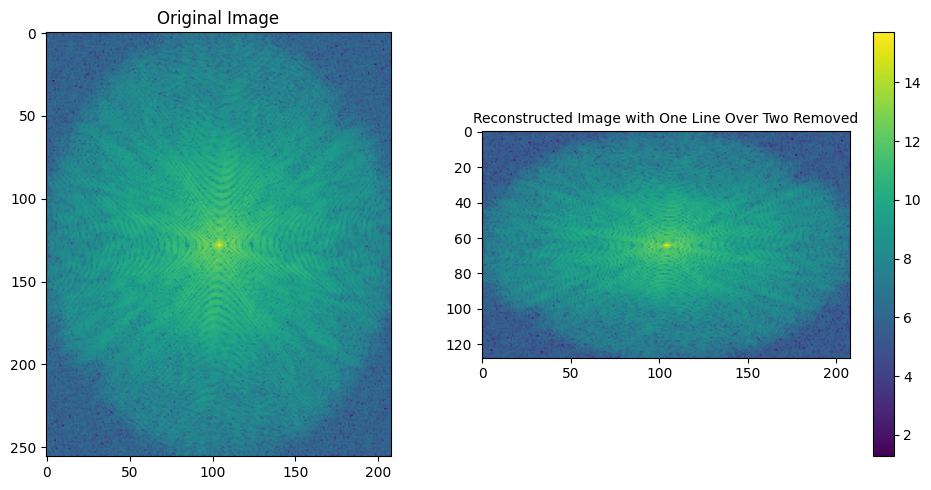

In [9]:
# Get the k-space
k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_half_lines = k_space_imag[::2, :]

reconstructed_image = k_space_half_lines

reconstructed_image_abs = np.abs(reconstructed_image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image_abs)
plt.title("Reconstructed Image with One Line Over Two Removed",fontsize=10)

plt.tight_layout()
plt.colorbar()
plt.show()

###### Question 3.2 : Instructions
Second, instead of removing lines you will fill by 0 these lines. Again, compute the resulting image.

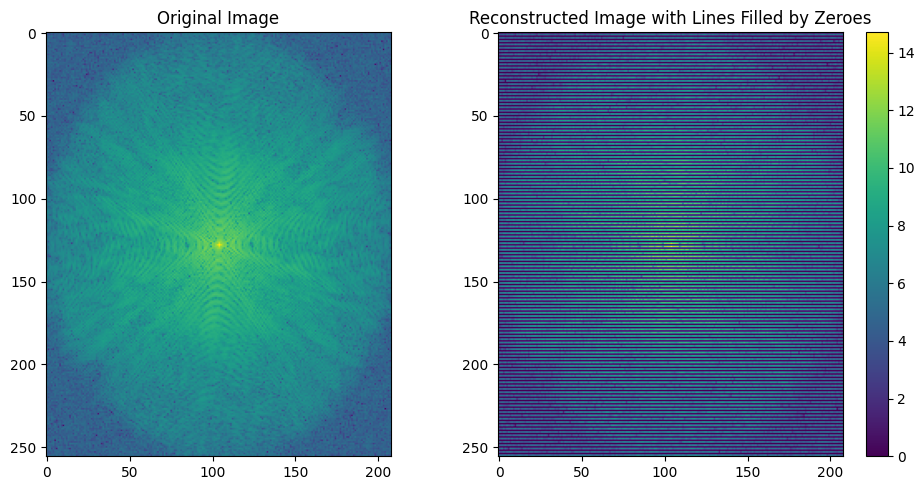

In [10]:
# Get the k-space
k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_zeros = k_space_imag.copy()
k_space_zeros[::2, :] = 0

reconstructed_image = k_space_zeros
reconstructed_image_abs = np.abs(reconstructed_image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image_abs)
plt.title("Reconstructed Image with Lines Filled by Zeroes")

plt.tight_layout()
plt.colorbar()
plt.show()


###### Question 3.3 : Instructions

Third, you will interpolate the lines filled by 0 to closest values in the k-Space. Compute the corresponding image and comment the result regarding the two previous exercices

100%|█████████████████████████████████████████████████████████████████████████████| 208/208 [00:00<00:00, 10989.67it/s]


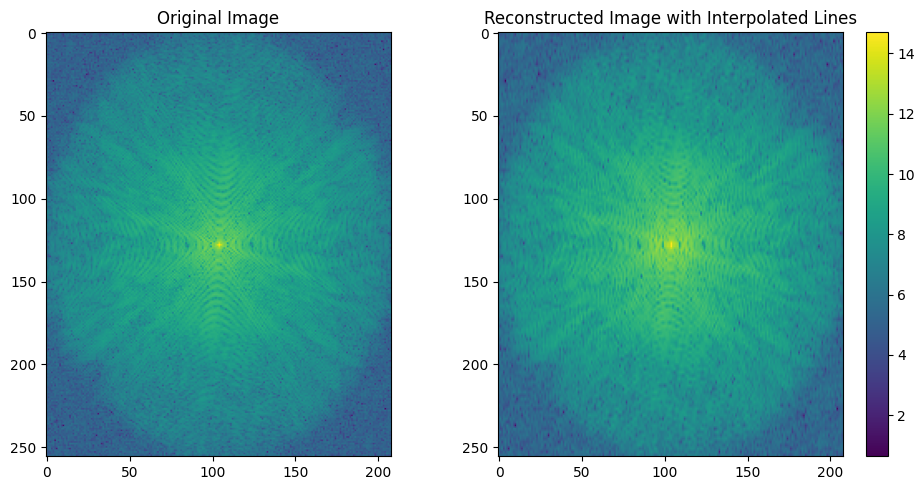

In [11]:
from tqdm import tqdm

k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_zeros = k_space_imag.copy()
k_space_zeros[::2, :] = 0

k_space_interp = k_space_zeros.copy()
for i in tqdm(range(k_space_zeros.shape[1])):
    for j in range(k_space_zeros.shape[0]):
        if k_space_zeros[j, i] == 0:
            k_space_interp[j, i] = (k_space_zeros[j - 1, i] + k_space_zeros[j + 1, i]) / 2

reconstructed_image = np.abs(k_space_interp)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image with Interpolated Lines")

plt.tight_layout()
plt.colorbar()
plt.show()

###### Question 3.4 : Instructions
Please repeat the entire exercise, but instead of applying the processing steps to each row, apply them to each column. Once complete, please provide commentary on the results and compare them to the results obtained from the row approach.

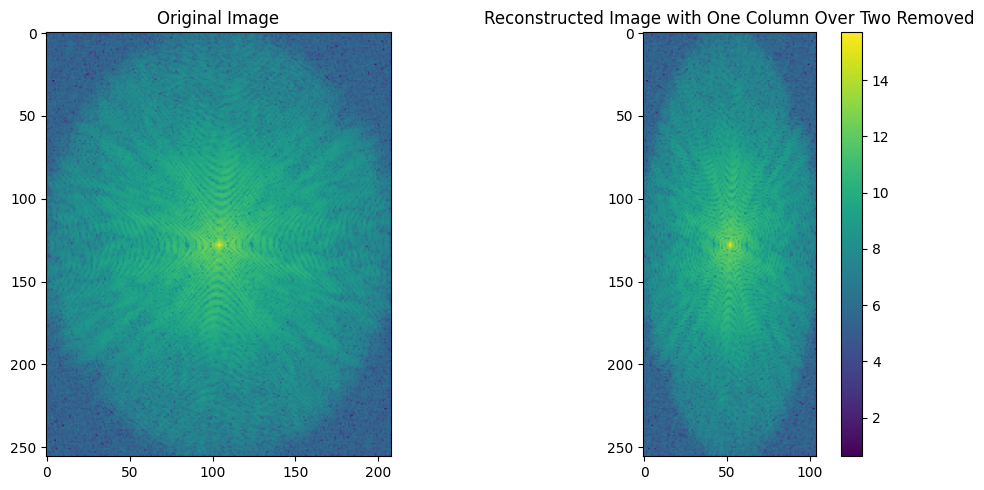

In [12]:
# Get the k-space
k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_half_columns = k_space_imag[:, ::2]

reconstructed_image = np.abs(k_space_half_columns)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image with One Column Over Two Removed")

plt.tight_layout()
plt.colorbar()
plt.show()

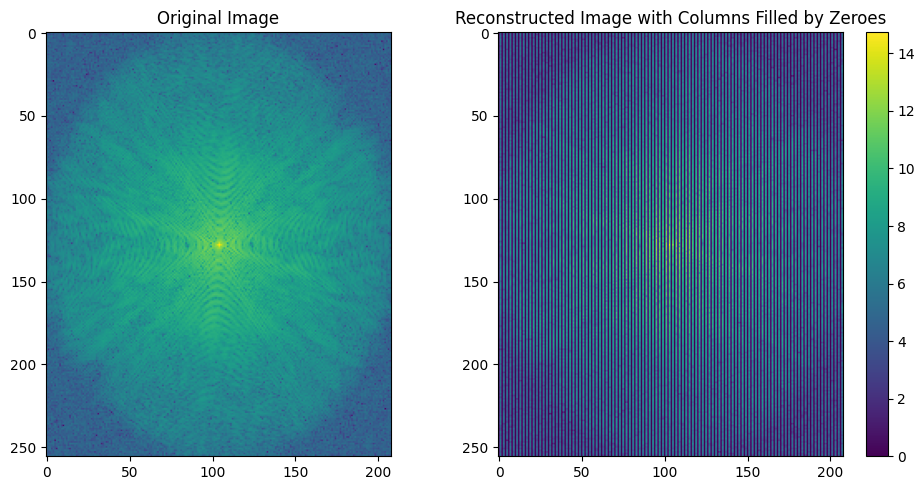

In [13]:
k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_zeros = k_space_imag.copy()
k_space_zeros[:, ::2] = 0

reconstructed_image = np.abs(k_space_zeros)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image with Columns Filled by Zeroes")

plt.tight_layout()
plt.colorbar()
plt.show()

100%|█████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 15479.37it/s]


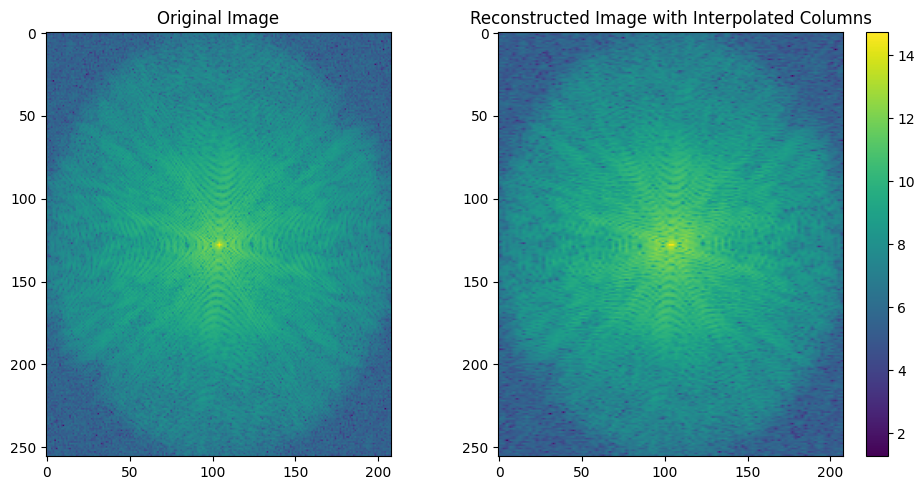

In [14]:
k_space = np.fft.fftshift(np.fft.fft2(image_array))
k_space_imag = np.log(np.abs(k_space))

k_space_zeros = k_space_imag.copy()
k_space_zeros[:, ::2] = 0

k_space_interp = k_space_zeros.copy()
for i in tqdm(range(k_space_zeros.shape[0])):
    for j in range(k_space_zeros.shape[1]):
        if k_space_zeros[i, j] == 0:
            k_space_interp[i, j] = (k_space_zeros[i, j - 1] + k_space_zeros[i, j + 1]) / 2

reconstructed_image = np.abs(k_space_interp)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image)
plt.title("Reconstructed Image with Interpolated Columns")

plt.tight_layout()
plt.colorbar()
plt.show()

When applying the processing steps to columns instead of rows, the reconstructed images show artifacts in a different orientation compared to the row approach. The reconstructed images with one column over two removed and columns filled by zeroes show vertical stripes, whereas the images with rows removed or filled showed horizontal stripes. The image with interpolated columns has fewer artifacts, but still exhibits some distortions compared to the original image.

Comparing the row approach to the column approach, both methods show similar artifacts in the reconstructed images, with the main difference being the orientation of the artifacts. The image quality is slightly better when interpolating the missing data

###### Question 3.5 : Instructions
Assuming your code is functional, please replicate the same image processing steps using the file named flair.dcm

In [15]:
filename1 = "flair.dcm"
ds1 = pydicom.dcmread(filename1)

image_array1 = ds1.pixel_array

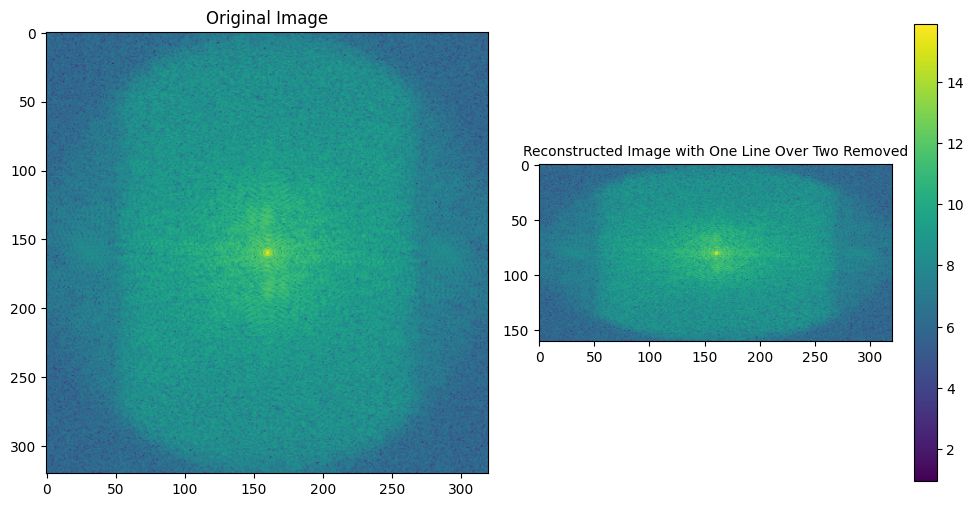

In [16]:
k_space1 = np.fft.fftshift(np.fft.fft2(image_array1))
k_space_imag1 = np.log(np.abs(k_space1))
k_space_imag_1 = k_space_imag1.copy()

k_space_half_lines1 = k_space_imag_1[::2, :]

reconstructed_image1 = k_space_half_lines1

reconstructed_image_abs1= np.abs(reconstructed_image1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag_1)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image_abs1)
plt.title("Reconstructed Image with One Line Over Two Removed",fontsize=10)

plt.tight_layout()
plt.colorbar()
plt.show()

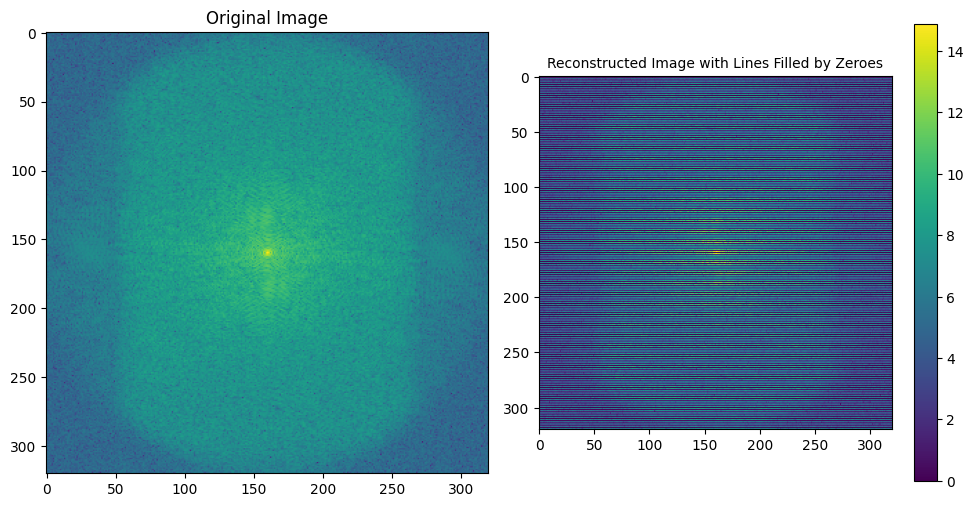

In [17]:
k_space_zeros1 = k_space_imag1.copy()
k_space_zeros1[::2, :] = 0

reconstructed_image1 = k_space_zeros1

reconstructed_image_abs1 = np.abs(reconstructed_image1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag1)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image_abs1)
plt.title("Reconstructed Image with Lines Filled by Zeroes",fontsize=10)

plt.tight_layout()
plt.colorbar()
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████| 320/320 [00:00<00:00, 8952.50it/s]


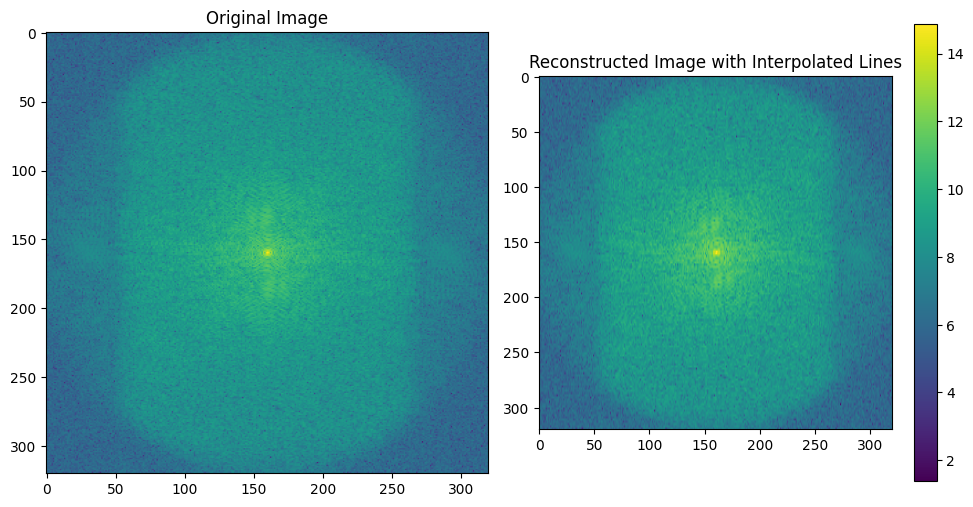

In [18]:
k_space_zeros1 = k_space_imag1.copy()
k_space_zeros1[::2, :] = 0

k_space_interp = k_space_zeros1.copy()
for i in tqdm(range(k_space_zeros1.shape[1])):
    for j in range(k_space_zeros1.shape[0]):
        if k_space_zeros1[j, i] == 0:
            k_space_interp[j, i] = (k_space_zeros1[j - 1, i] + k_space_zeros1[j + 1, i]) / 2

reconstructed_image1 = np.abs(k_space_interp)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag1)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image1)
plt.title("Reconstructed Image with Interpolated Lines")

plt.tight_layout()
plt.colorbar()
plt.show()

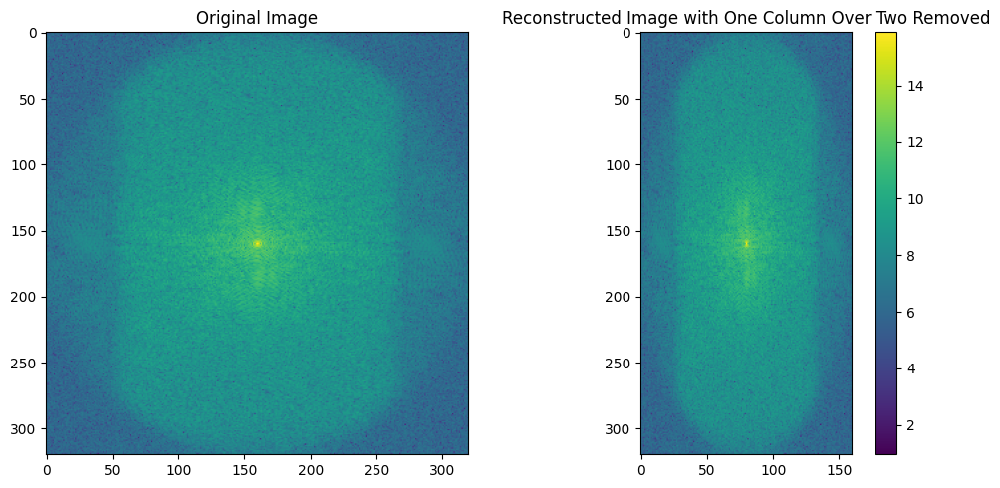

In [19]:
k_space_imag_1 = k_space_imag1.copy()

k_space_half_columns1 = k_space_imag_1[:, ::2]

reconstructed_image1 = np.abs(k_space_half_columns1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag1)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image1)
plt.title("Reconstructed Image with One Column Over Two Removed")

plt.tight_layout()
plt.colorbar()
plt.show()

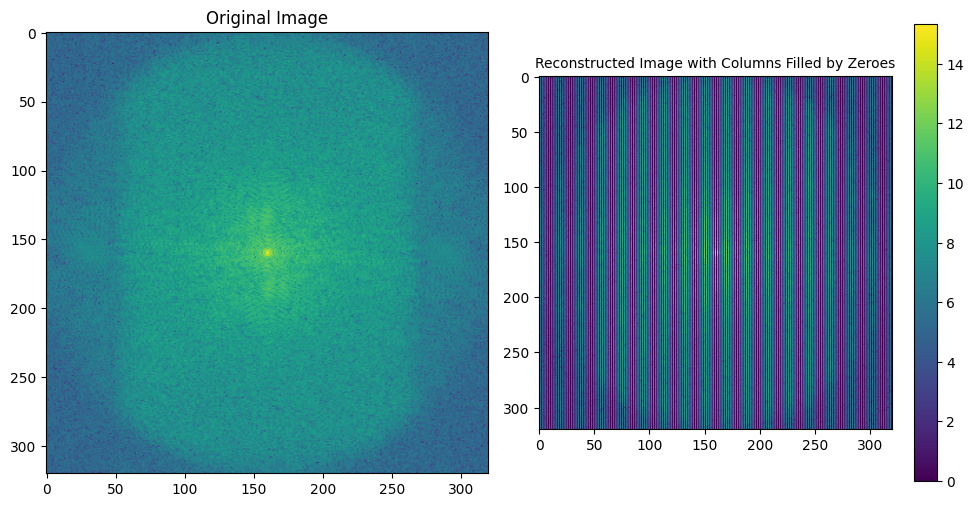

In [20]:
k_space_zeros1 = k_space_imag1.copy()
k_space_zeros1[:, ::2] = 0

reconstructed_image1 = np.abs(k_space_zeros1)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag1)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image1)
plt.title("Reconstructed Image with Columns Filled by Zeroes",fontsize=10)

plt.tight_layout()
plt.colorbar()
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████| 320/320 [00:00<00:00, 9398.41it/s]


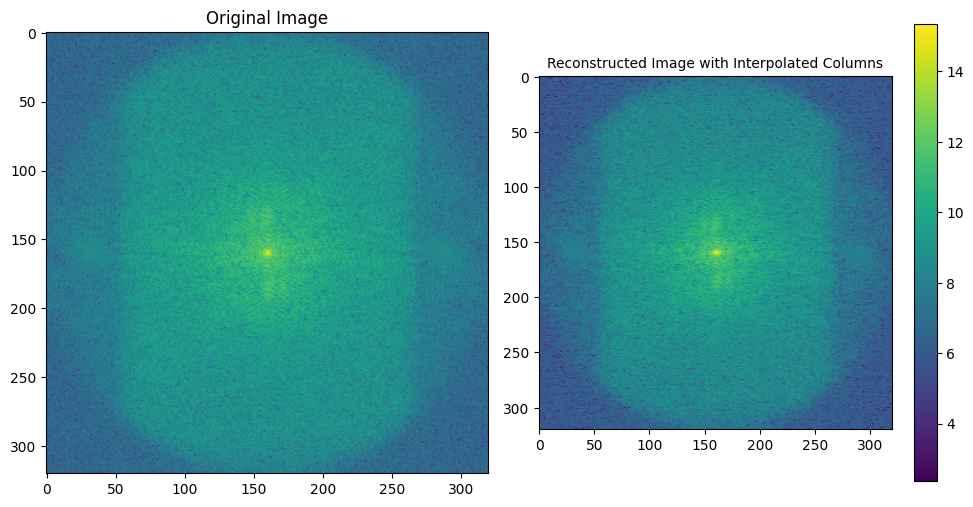

In [21]:
k_space_zeros1 = k_space_imag1.copy()
k_space_zeros1[:, ::2] = 0

k_space_interp1 = k_space_zeros1.copy()
for i in tqdm(range(k_space_zeros1.shape[0])):
    for j in range(k_space_zeros1.shape[1]):
        if k_space_zeros1[i, j] == 0:
            k_space_interp1[i, j] = (k_space_zeros1[i, j - 1] + k_space_zeros1[i, j + 1]) / 2

reconstructed_image1 = np.abs(k_space_interp1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(k_space_imag1)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image1)
plt.title("Reconstructed Image with Interpolated Columns",fontsize=10)

plt.tight_layout()
plt.colorbar()
plt.show()


###### Question 4.1 : Instructions
Find the cause of the artifact in file artifact.npy and try to remove it. Can you name this artifact ?

In [22]:
artifact = np.load("artifact.npy")

In [23]:
k_space_arti = np.fft.fftshift(np.fft.fft2(artifact))

In [24]:
# I Found the center and modified
k_space_imag = np.log(np.abs(k_space_arti))
k_space_center_kept = k_space_imag.copy()
center_x, center_y = k_space_imag.shape[0] // 2, k_space_imag.shape[1] // 2
center_size = 60
k_space_center_kept[:center_x - center_size, :] = np.nan
k_space_center_kept[center_x + center_size:, :] = np.nan
k_space_center_kept[:, :center_y - center_size] = np.nan
k_space_center_kept[:, center_y + center_size:] = np.nan

k_space_modified = np.zeros_like(k_space_arti, dtype=np.complex128)
k_space_modified[
    center_x - center_size:center_x + center_size,
    center_y - center_size:center_y + center_size,
] = np.exp(k_space_center_kept[
    center_x - center_size:center_x + center_size,
    center_y - center_size:center_y + center_size,
]) * np.exp(1j * np.angle(k_space_arti[
    center_x - center_size:center_x + center_size,
    center_y - center_size:center_y + center_size,
]))

reconstructed_image = np.fft.ifft2(np.fft.ifftshift(k_space_modified))

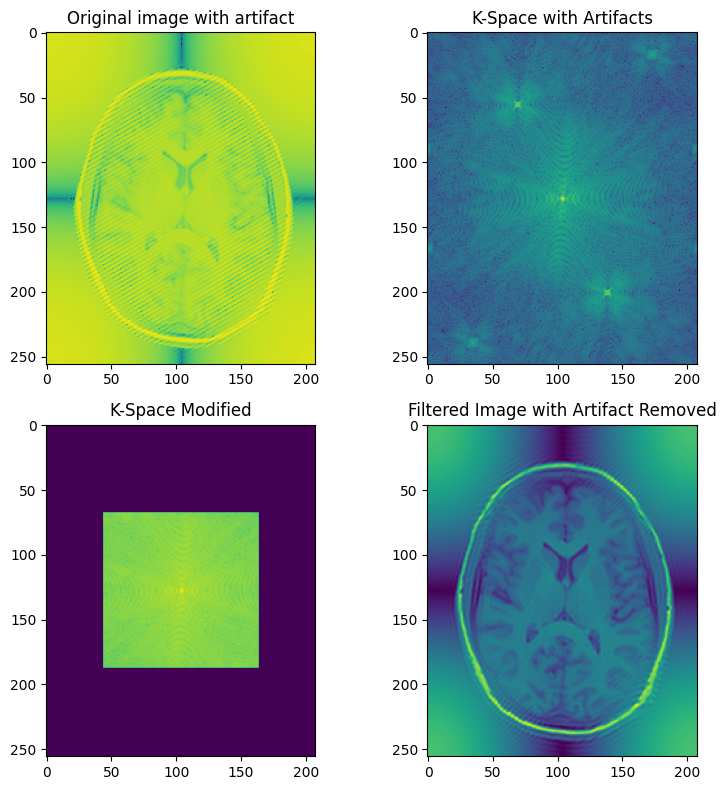

In [25]:
plt.figure(figsize=(8, 8))

plt.subplot(2, 2, 1)
plt.imshow(np.log(np.abs(artifact)))
plt.title("Original image with artifact")

plt.subplot(2, 2, 2)
plt.imshow(np.log(np.abs(k_space_arti)))
plt.title("K-Space with Artifacts")

plt.subplot(2, 2, 3)
plt.imshow(np.log(np.abs(k_space_modified) + 1e-10)) 
plt.title("K-Space Modified")

plt.subplot(2, 2, 4)
plt.imshow(np.abs(reconstructed_image))
plt.title("Filtered Image with Artifact Removed")

plt.tight_layout()
plt.show()

###### Question 1.1 : Instructions
Open the Shepp-Logan phantom and display it using matplotlib (resolution 512x512). How many grey levels are present in the phantom ?

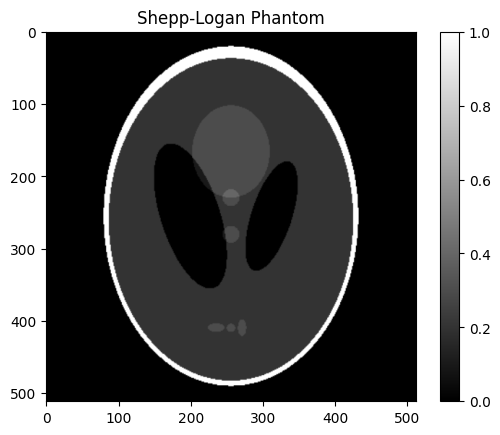

There are 1911 unique grey levels in the phantom.


In [26]:
from skimage.data import shepp_logan_phantom
from skimage.transform import resize

image = shepp_logan_phantom()

image_resized = resize(image, (512, 512))

plt.imshow(image_resized, cmap="gray")
plt.title("Shepp-Logan Phantom")
plt.colorbar()
plt.show()

unique_grey_levels = len(np.unique(image_resized))
print(f"There are {unique_grey_levels} unique grey levels in the phantom.")

###### Question 2.1 : Instructions
Open the file named qmri.npy. You have to display images in the same way as the Figure 3.2.

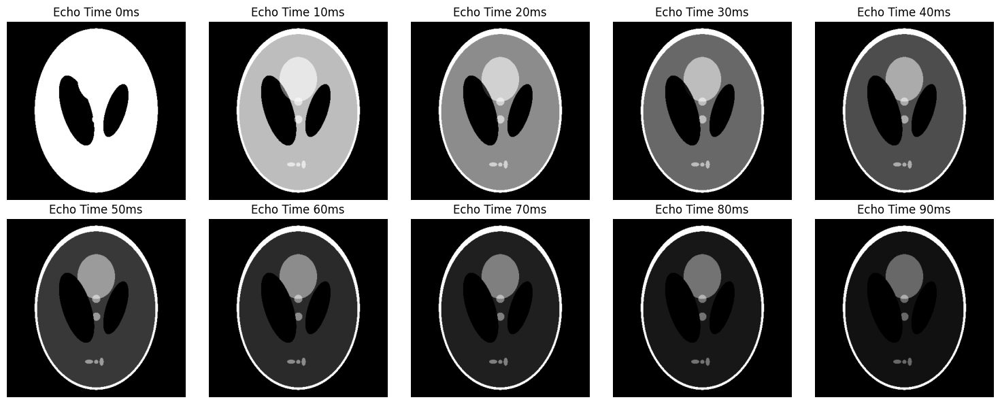

In [27]:
qmri_data = np.load("qmri.npy")

echo_times = np.arange(0, 100, 10)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(qmri_data[:, :, i], cmap="gray")
    ax.set_title(f"Echo Time {echo_times[i]}ms")
    ax.axis("off")

plt.tight_layout()
plt.show()

###### Question 2.2 : Instructions
Create a function that can evaluate the R2*(1/T2*) by computing the mono-exponential decay for each voxel along the images. Ensure that the echo time is correctly set in your fitting function. Once you have implemented the function, use it to compute the R2* values for the image data.

In [36]:
from scipy.optimize import curve_fit

def mono_exp_decay(echo_time, s0, r2_star):
    signal = s0 * np.exp(-echo_time * r2_star)
    return signal

def compute_r2_star(qmri_data, echo_times):
    r2_star_map = np.zeros(qmri_data.shape[:2])

    for i in range(qmri_data.shape[0]):
        for j in range(qmri_data.shape[1]):
            signal_intensities = qmri_data[i, j, :]
            try:
                popt, _ = curve_fit(mono_exp_decay, echo_times, signal_intensities, p0=(signal_intensities[0], 1))
                r2_star_map[i, j] = popt[1]
            except RuntimeError:
                r2_star_map[i, j] = 0

    return r2_star_map

C:\Users\ksevi\AppData\Local\Temp\ipykernel_23360\216114553.py:4: RuntimeWarning: overflow encountered in exp
  signal = s0 * np.exp(-echo_time * r2_star)


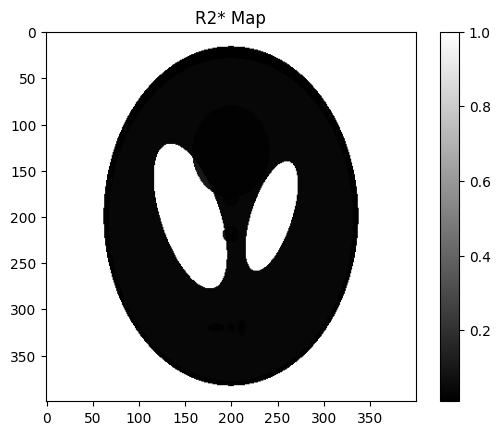

In [37]:
echo_times = np.linspace(0, 90, num=10)
r2_star_map = compute_r2_star(qmri_data, echo_times)

plt.imshow(r2_star_map, cmap="gray")
plt.title("R2* Map")
plt.colorbar()
plt.show()

###### Question 2.3 : Instructions

Create a matrix of contrast to know when the contrast between tissues are maximized (which echo and which contrast value).

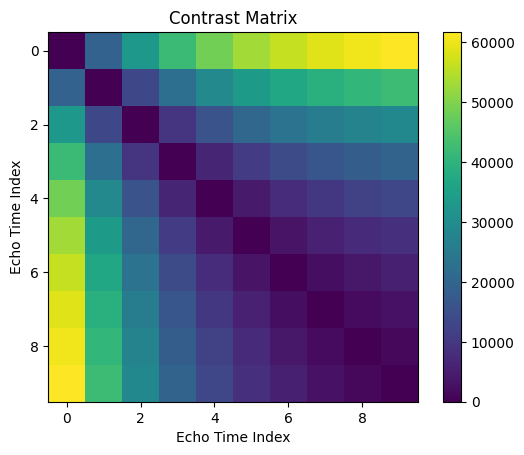

Maximum contrast between tissues is 61683.9998554799 at echo times 0.0 ms and 90.0 ms.


In [41]:
def compute_contrast_matrix(qmri_data):
    num_echoes = qmri_data.shape[2]
    contrast_matrix = np.zeros((num_echoes, num_echoes))
    
    for i in range(num_echoes):
        for j in range(num_echoes):
            tissue_1 = qmri_data[:, :, i]
            tissue_2 = qmri_data[:, :, j]
            contrast = np.abs(tissue_1 - tissue_2).sum()
            contrast_matrix[i, j] = contrast
            
    return contrast_matrix

contrast_matrix = compute_contrast_matrix(qmri_data)

plt.imshow(contrast_matrix)
plt.title("Contrast Matrix")
plt.xlabel("Echo Time Index")
plt.ylabel("Echo Time Index")
plt.colorbar()
plt.show()

max_contrast_indices = np.unravel_index(np.argmax(contrast_matrix), contrast_matrix.shape)
max_contrast_echo_1 = echo_times[max_contrast_indices[0]]
max_contrast_echo_2 = echo_times[max_contrast_indices[1]]
max_contrast_value = contrast_matrix[max_contrast_indices]

print(f"Maximum contrast between tissues is {max_contrast_value} at echo times {max_contrast_echo_1} ms and {max_contrast_echo_2} ms.")


###### Question 3.1 : Instructions
Compute the error map between noisy and non noisy T2* map.

C:\Users\ksevi\AppData\Local\Temp\ipykernel_23360\216114553.py:4: RuntimeWarning: overflow encountered in exp
  signal = s0 * np.exp(-echo_time * r2_star)
C:\Users\ksevi\AppData\Local\Temp\ipykernel_23360\216114553.py:4: RuntimeWarning: overflow encountered in multiply
  signal = s0 * np.exp(-echo_time * r2_star)


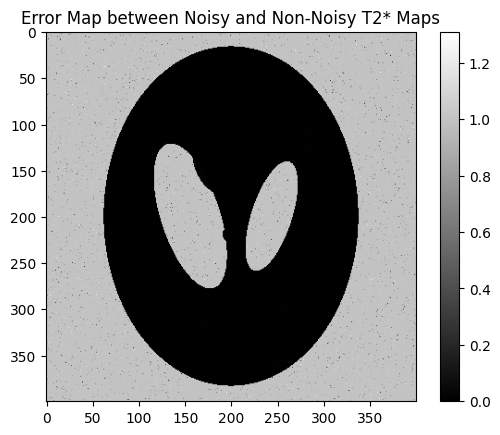

In [43]:
qmri_noisy_data = np.load("qmri_noised.npy")
r2_star_noisy = compute_r2_star(qmri_noisy_data, echo_times)

# Compute the error map
error_map = np.abs(r2_star_noisy - r2_star_map)

plt.imshow(error_map, cmap="gray")
plt.title("Error Map between Noisy and Non-Noisy T2* Maps")
plt.colorbar()
plt.show()

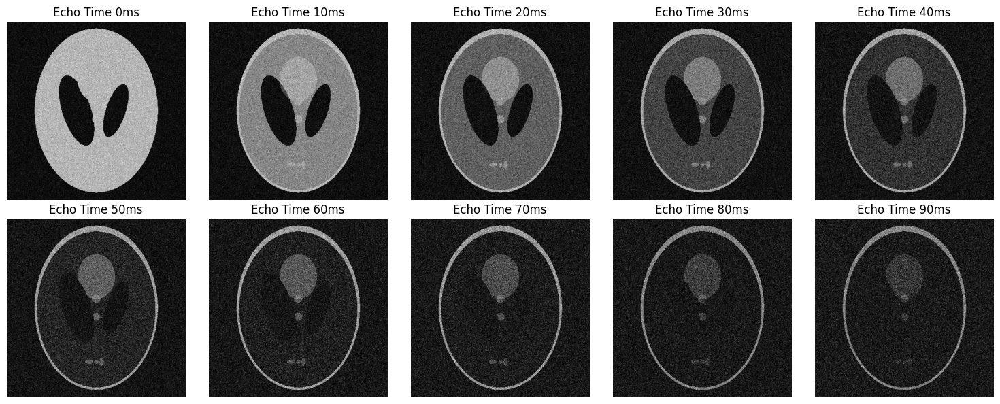

In [44]:
echo_times_noi = np.arange(0, 100, 10)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(qmri_noisy_data[:, :, i], cmap="gray")
    ax.set_title(f"Echo Time {echo_times_noi[i]}ms")
    ax.axis("off")

plt.tight_layout()
plt.show()

###### Question 3.2 : Instructions
Compute the SNR for each tissue (background comparison)

In [40]:
roi_tissue1 = np.array([[60, 0], [335, 380]])
roi_background = np.array([[0, 0], [400, 400]])

mean_signal_tissue1 = np.mean(r2_star_noisy[roi_tissue1[0][0]:roi_tissue1[1][0], roi_tissue1[0][1]:roi_tissue1[1][1]])
noise_std_background = np.std(r2_star_noisy[roi_background[0][0]:roi_background[1][0], roi_background[0][1]:roi_background[1][1]])

snr_tissue1 = mean_signal_tissue1 / noise_std_background

print("SNR for tissue 1:", snr_tissue1)

SNR for tissue 1: 0.5283126570996839
